# <center> Instance Segmentation for Pig Dataset <center>

## 1. Prepare

In [ ]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

     |████████████████████████████████| 276kB 8.4MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=162a93eb2d1f9538cd1e10d104ad5bb24a75a65ad552695d2a1bd6f3e5532ad1
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5MB 24kB/s 
     |████████████████████████████████| 17.3MB 206kB/s 
ERROR: torchtext 0.10.0 has requirement torch==1.9.0, but you'll have torch 1.8.0+cu101 which is incompatible.
  Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Succes

In [ ]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2.data.datasets import register_coco_instances

for d in ["train", "val"]:
    register_coco_instances(f"pig_{d}", {}, f"pig/{d}.json", f"pig/{d}")

[06/19 07:27:36 d2.data.datasets.coco]: Loaded 24 images in COCO format from pig/train.json


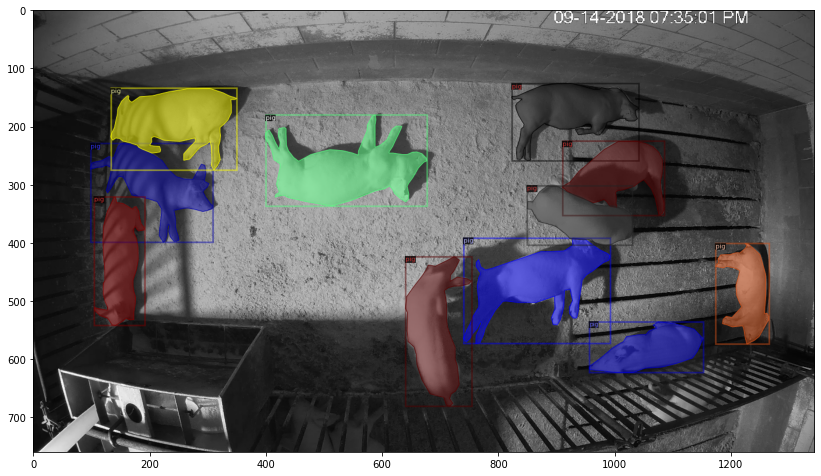

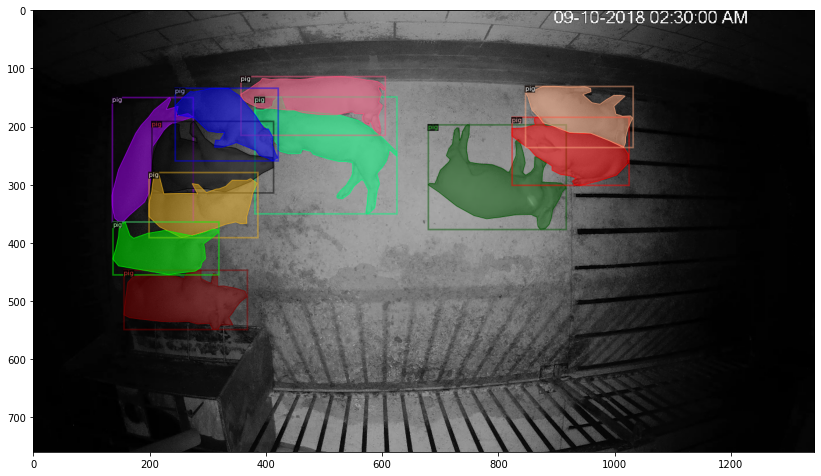

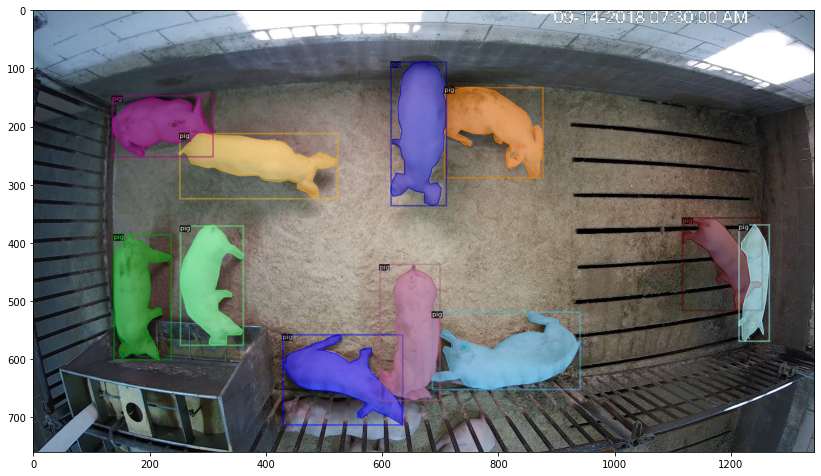

In [ ]:
import random

dataset_dicts = DatasetCatalog.get("pig_train")
microcontroller_metadata = MetadataCatalog.get("pig_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=microcontroller_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

## 2. Training

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("pig_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.DEVICE = 'cuda:0'

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/19 07:27:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:02, 67.8MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[06/19 07:27:47 d2.engine.train_loop]: Starting training from iteration 0
[06/19 07:27:58 d2.utils.events]:  eta: 0:08:36  iter: 19  total_loss: 2.494  loss_cls: 0.7185  loss_box_reg: 0.8522  loss_mask: 0.6966  loss_rpn_cls: 0.1069  loss_rpn_loc: 0.05368  time: 0.5221  data_time: 0.0359  lr: 4.9953e-06  max_mem: 2674M
[06/19 07:28:09 d2.utils.events]:  eta: 0:08:41  iter: 39  total_loss: 2.427  loss_cls: 0.6944  loss_box_reg: 0.8607  loss_mask: 0.6908  loss_rpn_cls: 0.1043  loss_rpn_loc: 0.05561  time: 0.5278  data_time: 0.0067  lr: 9.9902e-06  max_mem: 2674M
[06/19 07:28:20 d2.utils.events]:  eta: 0:08:23  iter: 59  total_loss: 2.305  loss_cls: 0.6386  loss_box_reg: 0.8464  loss_mask: 0.6748  loss_rpn_cls: 0.08202  loss_rpn_loc: 0.05027  time: 0.5287  data_time: 0.0074  lr: 1.4985e-05  max_mem: 2674M
[06/19 07:28:30 d2.utils.events]:  eta: 0:08:12  iter: 79  total_loss: 2.216  loss_cls: 0.5818  loss_box_reg: 0.8733  loss_mask: 0.6562  loss_rpn_cls: 0.04828  loss_rpn_loc: 0.04834  time

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## 3. Predict

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.DEVICE = 'cpu'
predictor = DefaultPredictor(cfg)

[06/19 08:54:58 d2.data.datasets.coco]: Loaded 6 images in COCO format from pig/val.json
Time: 7.009845972061157


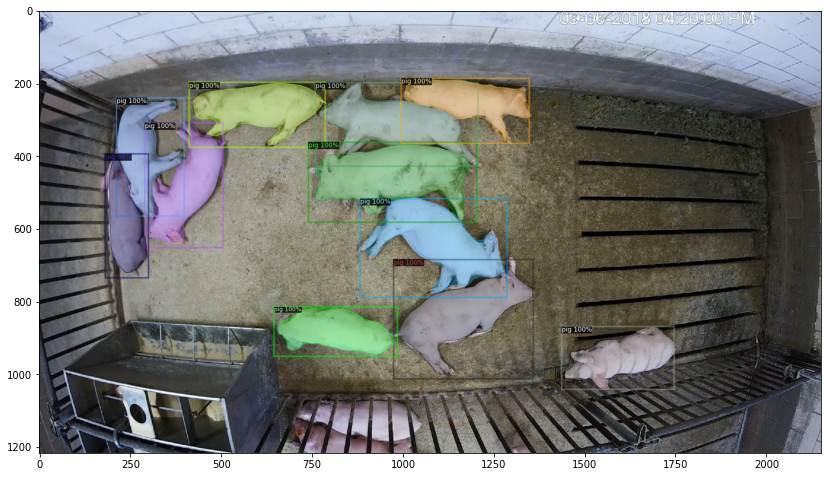

Time: 6.852051734924316


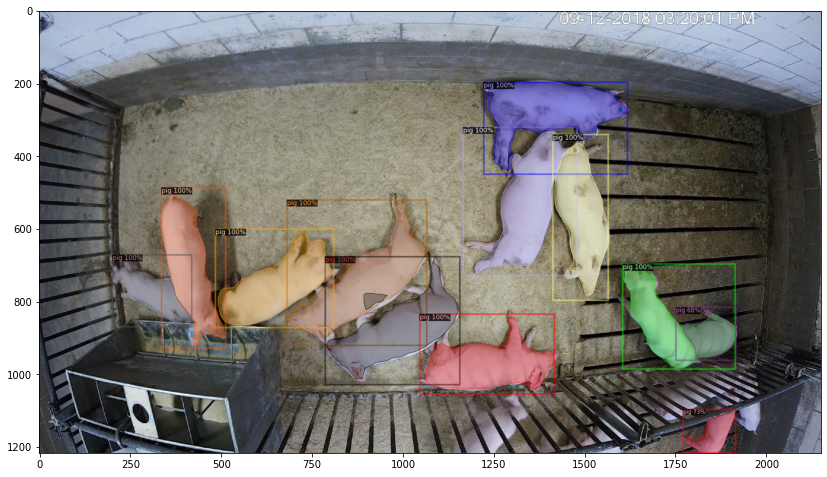

Time: 6.824297904968262


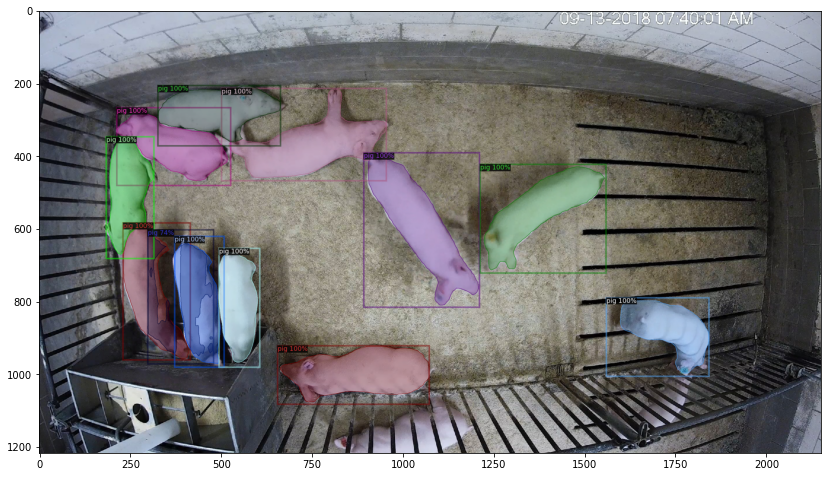

Time: 6.80432653427124


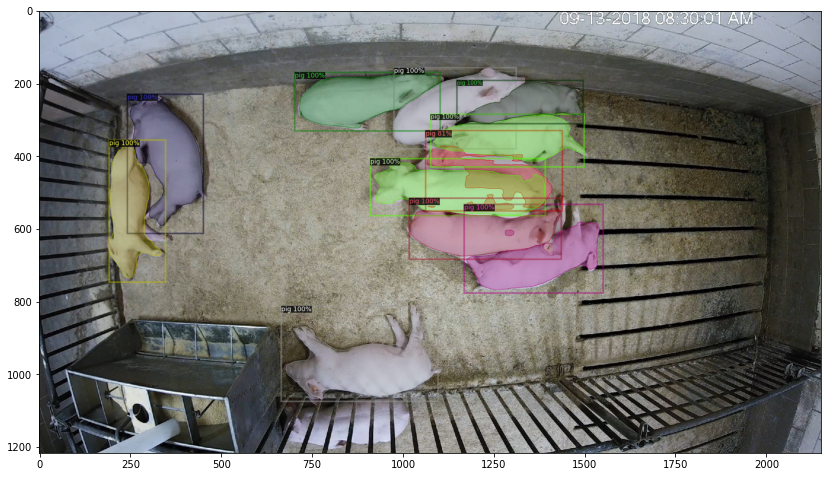

Time: 6.791753053665161


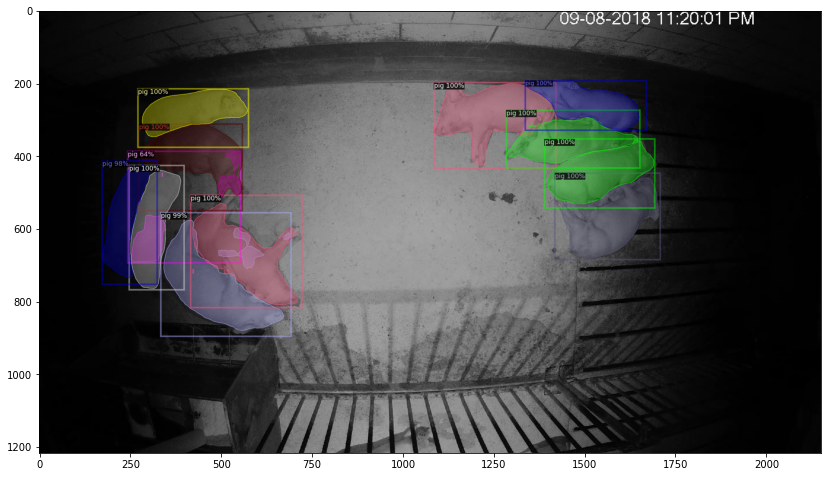

Time: 6.620410919189453


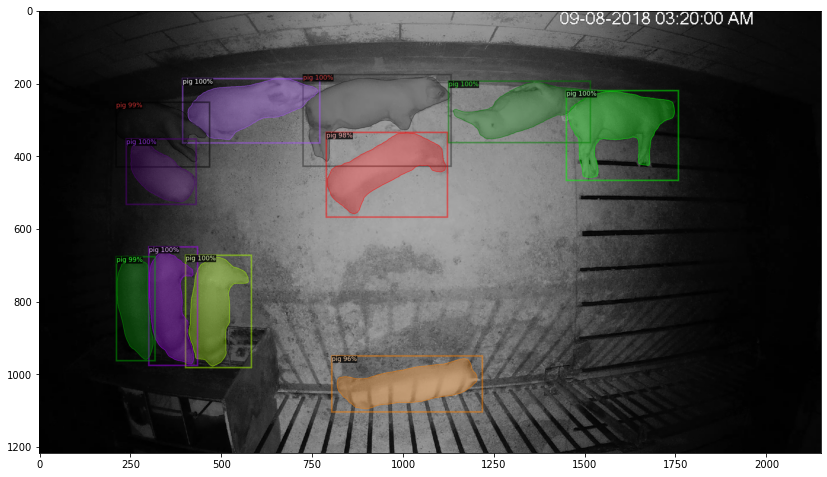

In [ ]:
import time
from detectron2.utils.visualizer import ColorMode

dataset_dicts = DatasetCatalog.get("pig_val")
for d in dataset_dicts:
    im = cv2.imread(d["file_name"])
    start = time.time()
    outputs = predictor(im)
    print("Time: " + str(time.time() - start))
    v = Visualizer(im[:, :, ::-1],
                   metadata=microcontroller_metadata,
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("pig_val", cfg, False, output_dir="output/")
val_loader = build_detection_test_loader(cfg, "pig_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [06/19 07:38:09 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[06/19 07:38:09 d2.data.datasets.coco]: Loaded 6 images in COCO format from pig/val.json
[06/19 07:38:09 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    pig     | 66           |
|            |              |
[06/19 07:38:09 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/19 07:38:09 d2.data.common]: Serializing 6 elements to byte tensors and concatenating them all ...
[06/19 07:38:09 d2.data.common]: Serialized dataset takes 0.02 MiB
[06/19 07:38:09 d2.evaluation.evaluator]: Start inference on 6 images
[06/19 07:38:12 d2.evaluation.evaluator]: Total inference time: 0:00:00.352436 (0.352436 s / img per device, on 1 device

OrderedDict([('bbox',
              {'AP': 73.60838370333478,
               'AP50': 97.78011737825365,
               'AP75': 81.96482480524476,
               'APl': 74.50588339153708,
               'APm': 74.15841584158416,
               'APs': 80.0}),
             ('segm',
              {'AP': 75.27398580900753,
               'AP50': 95.84213016889925,
               'AP75': 94.31277396315481,
               'APl': 76.80507317236257,
               'APm': 75.14851485148515,
               'APs': 80.0})])